In [1]:
import os

import matplotlib.pyplot as plt
plt.style.use('dark_background')
import tifffile as tiff
import numpy as np

import random
from PIL import Image

In [2]:
import tensorflow as tf 
print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.17.0


In [3]:
import keras
print("Keras version:", keras.__version__)

Keras version: 3.5.0


In [4]:
import segmentation_models as sm

Segmentation Models: using `keras` framework.


In [5]:
print("Segmentation Models version:", sm.__version__)

Segmentation Models version: 1.0.1


# **_Filterring images_** 

In [6]:
labels_path = 'data/labels'
images_path = 'data/images'
all_labels = os.listdir(labels_path)
filtered_labels = [label for label in all_labels if '_' not in label]

for label in all_labels:
    if '_' in label:
        os.remove(os.path.join(labels_path, label))

In [7]:
valid_labels = [label for label in filtered_labels if f"{label.replace('.png', '')}.tif" in os.listdir(images_path)]

In [8]:
print(len(filtered_labels))
print(len(valid_labels))

306
306


C:\Users\salma.muhammad\AppData\Local\Temp\ipykernel_10076\334679207.py:42: RuntimeWarning: invalid value encountered in divide
  ndwi = (green_band - nir_band) / (green_band + nir_band)


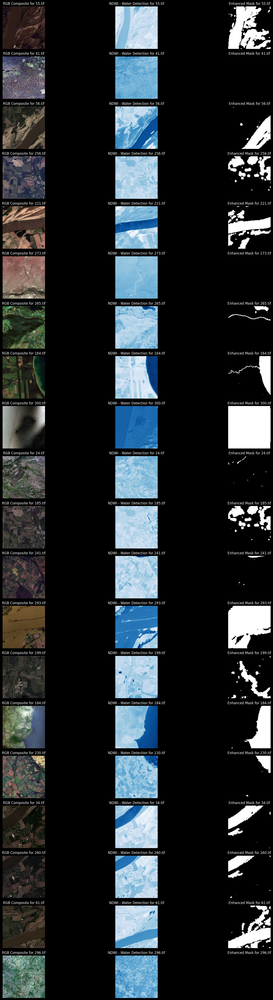

In [9]:
all_files = [f for f in os.listdir(images_path) if f.endswith('.tif')]
random_files = random.sample(all_files, 20)

def normalize_channel(channel):
    min_val = np.min(channel)
    max_val = np.max(channel)
    return (channel - min_val) / (max_val - min_val)

def enhance_mask(mask):
    # Convert the mask to a NumPy array
    mask_array = np.array(mask)
    
    # Multiply by a constant to enhance contrast
    enhanced_mask = mask_array * 255  # Assuming mask values are in [0, 1]
    enhanced_mask = np.clip(enhanced_mask, 0, 255)  # Ensure the values are within [0, 255]
    return enhanced_mask.astype(np.uint8)

fig, axes = plt.subplots(20, 3, figsize=(20, 50))

for i, image_file in enumerate(random_files):
    image_path = os.path.join(images_path, image_file)
    label_file = os.path.splitext(image_file)[0] + ".png"  # Assuming mask has the same name with .png extension
    label_path = os.path.join(labels_path, label_file)

    # Load image and mask
    image = tiff.imread(image_path)
    mask = Image.open(label_path)
    
    # Enhance the mask
    enhanced_mask = enhance_mask(mask)
    
    # Extract RGB (Blue = Band 2, Green = Band 3, Red = Band 4)
    blue_band = normalize_channel(image[:, :, 1])  # Band 2 - Blue
    green_band = normalize_channel(image[:, :, 2])  # Band 3 - Green
    red_band = normalize_channel(image[:, :, 3])  # Band 4 - Red

    # Create an RGB composite
    rgb_composite = np.dstack((red_band, green_band, blue_band))
    
    # Extract the NIR band and calculate NDWI
    nir_band = normalize_channel(image[:, :, 4])  # Band 5 - NIR
    ndwi = (green_band - nir_band) / (green_band + nir_band)
    
    # Display the RGB composite
    axes[i, 0].imshow(rgb_composite)
    axes[i, 0].set_title(f'RGB Composite for {image_file}')
    axes[i, 0].axis('off')
    
    # Display the NDWI
    axes[i, 1].imshow(ndwi, cmap='Blues')  # Blue colormap to highlight water
    axes[i, 1].set_title(f'NDWI - Water Detection for {image_file}')
    axes[i, 1].axis('off')
    
    # Display the enhanced mask
    axes[i, 2].imshow(enhanced_mask, cmap='gray')  # Grayscale colormap for masks
    axes[i, 2].set_title(f'Enhanced Mask for {image_file}')
    axes[i, 2].axis('off')

# Adjust layout to ensure everything fits
plt.tight_layout()
plt.show()

# **_Reading images_**

In [10]:
image_files = [f for f in os.listdir(images_path) if f.endswith('.tif')]

images = []
masks = []

for image_file in image_files:
  
    image_path = os.path.join(images_path, image_file)
    label_file = os.path.splitext(image_file)[0] + ".png"  
    label_path = os.path.join(labels_path, label_file)

    image = tiff.imread(image_path)
    mask = Image.open(label_path)
    
    mask = np.array(mask)

    mask = (mask > 0).astype(np.uint8)
    
    images.append(image)
    masks.append(mask)

# Convert lists to numpy arrays
images = np.array(images)
masks = np.array(masks)

# Check the shapes of the loaded images and masks
print(f'Loaded {len(images)} images with shape {images.shape}')
print(f'Loaded {len(masks)} masks with shape {masks.shape}')

Loaded 306 images with shape (306, 128, 128, 12)
Loaded 306 masks with shape (306, 128, 128)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0105693828844187].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.0466960352422907].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.1524663677130045].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.013960631020522].


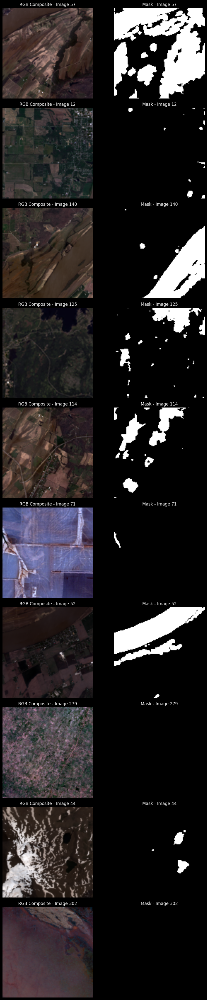

In [11]:
def normalize_channel(channel):
    min_val = np.min(channel)
    max_val = np.max(channel)
    # print(f"channel min:{min_val}")
    # print(f"channel max:{max_val}")
    return (channel - min_val ) / (max_val )

random.seed(42)


indices = random.sample(range(len(images)), 10)


fig, axes = plt.subplots(10, 2, figsize=(10, 40))

for i, idx in enumerate(indices):
  
    image = images[idx]
    mask = masks[idx]
    
    # Extract RGB channels (Blue = Band 2, Green = Band 3, Red = Band 4)
    blue_band = normalize_channel(image[:, :, 1])  # Band 2 - Blue
    green_band = normalize_channel(image[:, :, 2])  # Band 3 - Green
    red_band = normalize_channel(image[:, :, 3])  # Band 4 - Red
   
    # Stack RGB channels
    rgb_composite = np.dstack((red_band, green_band, blue_band))
    
    # Plot the RGB composite
    axes[i, 0].imshow(rgb_composite)
    axes[i, 0].set_title(f'RGB Composite - Image {idx}')
    axes[i, 0].axis('off')
    
    # Plot the corresponding mask
    axes[i, 1].imshow(mask, cmap='gray')
    
    axes[i, 1].set_title(f'Mask - Image {idx}')
    axes[i, 1].axis('off')

# Adjust layout to ensure proper spacing
plt.tight_layout()
plt.show()

In [12]:
def normalize_image(image):

    norm_img = np.zeros_like(image, dtype=np.float32)
    
    
    for b in range(image.shape[2]):
        band = image[:, :, b]
        min_val = np.min(band)
        max_val = np.max(band)
        
       
        if max_val > 0:
            norm_img[:, :, b] = (band ) / (max_val )
        else:
            norm_img[:, :, b] = 0  # If max_val is 0, just copy the band as is

    return norm_img

In [13]:
images_normalized = np.array([normalize_image(img) for img in images])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010569382..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046696037..1.0].


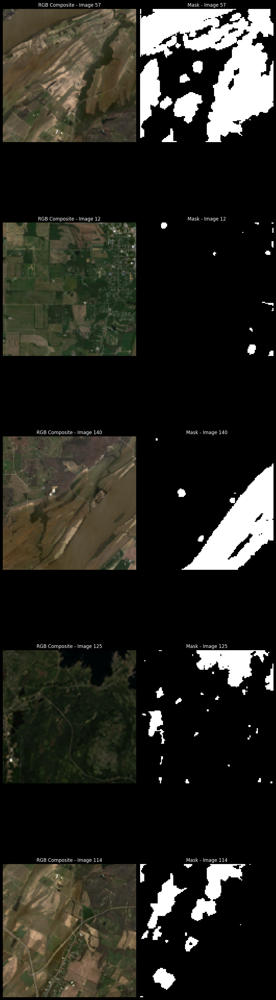

In [14]:
random.seed(42)
indices = random.sample(range(len(images_normalized)), 5)
fig, axes = plt.subplots(5, 2, figsize=(10, 40))

for i, idx in enumerate(indices):
    
    image = images_normalized[idx]
    mask = masks[idx]
    
    # Extract RGB channels (Blue = Band 2, Green = Band 3, Red = Band 4)
    blue_band = image[:, :, 1]  # Band 2 - Blue
    green_band = image[:, :, 2] # Band 3 - Green
    red_band = image[:, :, 3]  # Band 4 - Red
   
    # Stack RGB channels
    rgb_composite = np.dstack((red_band, green_band, blue_band))
    
    # Plot the RGB composite
    axes[i, 0].imshow(rgb_composite)
    axes[i, 0].set_title(f'RGB Composite - Image {idx}')
    axes[i, 0].axis('off')
    
    # Plot the corresponding mask
    axes[i, 1].imshow(mask, cmap='gray')
 
    axes[i, 1].set_title(f'Mask - Image {idx}')
    axes[i, 1].axis('off')

# Adjust layout to ensure proper spacing
plt.tight_layout()
plt.show()

# Splitting our dataset

In [50]:
from sklearn.model_selection import train_test_split
X_train_val, X_test, y_train_val, y_test = train_test_split(images_normalized, masks, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train_val, y_train_val, test_size=0.3, random_state=42)

In [51]:
print(f"Train_x:{len(X_train)}")
print(f"Train_y:{len(y_train)}")
print(f"Val_x:{len(X_val)}")
print(f"Val_y:{len(y_val)}")
print(f"Test_x:{len(X_test)}")
print(f"Test_y:{len(y_test)}")

Train_x:170
Train_y:170
Val_x:74
Val_y:74
Test_x:62
Test_y:62


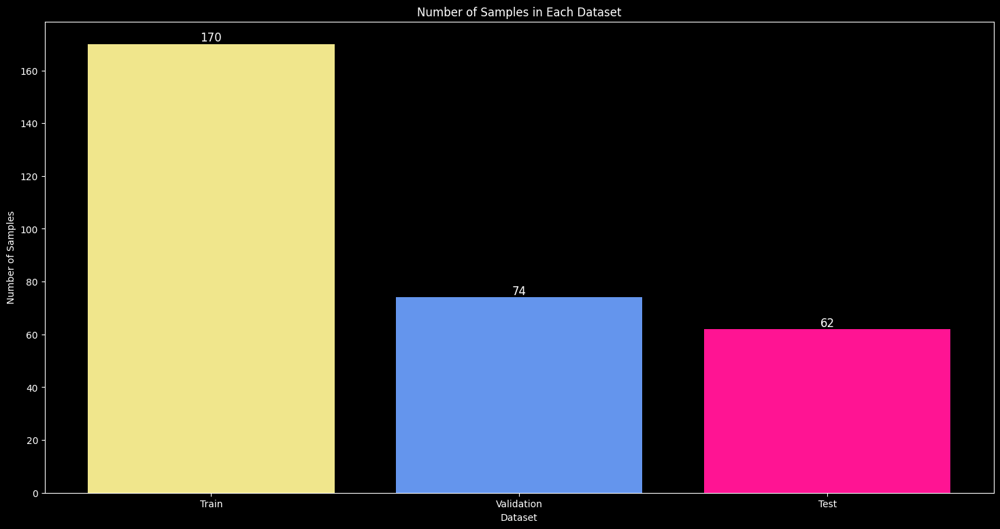

In [52]:
train_len = len(X_train)
val_len = len(X_val)
test_len = len(X_test)

labels = ['Train', 'Validation', 'Test']
image_counts = [train_len, val_len, test_len]

plt.figure(figsize=(18, 9))
bars = plt.bar(labels, image_counts, color=['#f0e68c', '#6495ed', '#ff1493'])

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, int(yval), va='bottom', ha='center', fontsize=12)

plt.xlabel('Dataset')
plt.ylabel('Number of Samples')
plt.title('Number of Samples in Each Dataset')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010569382..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03124548..1.0].


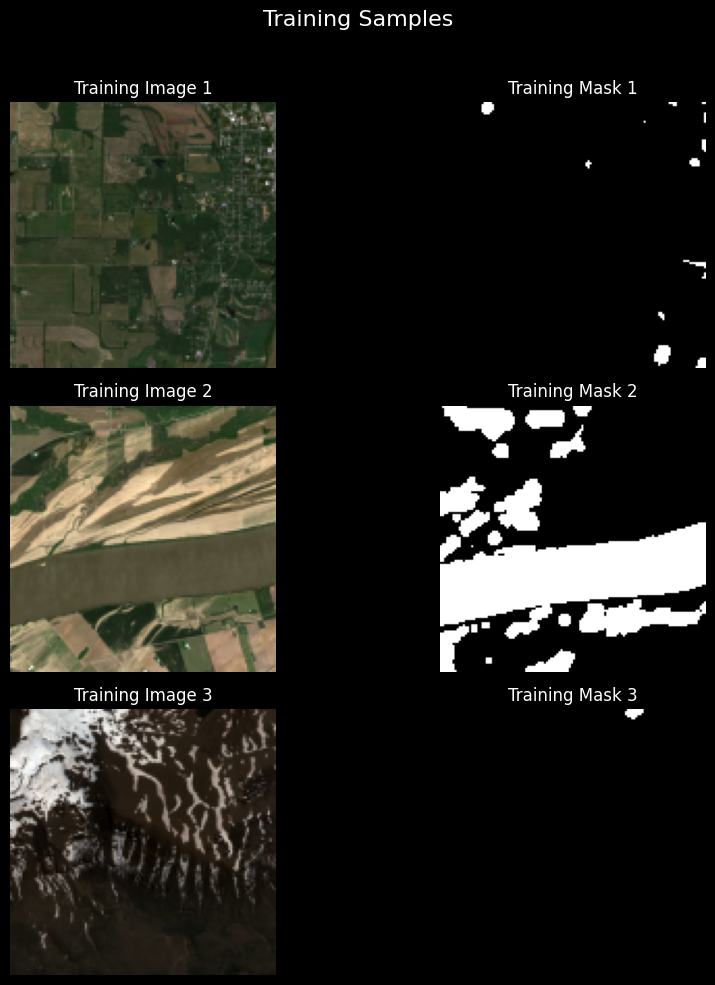

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0052095666..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02720637..1.0].


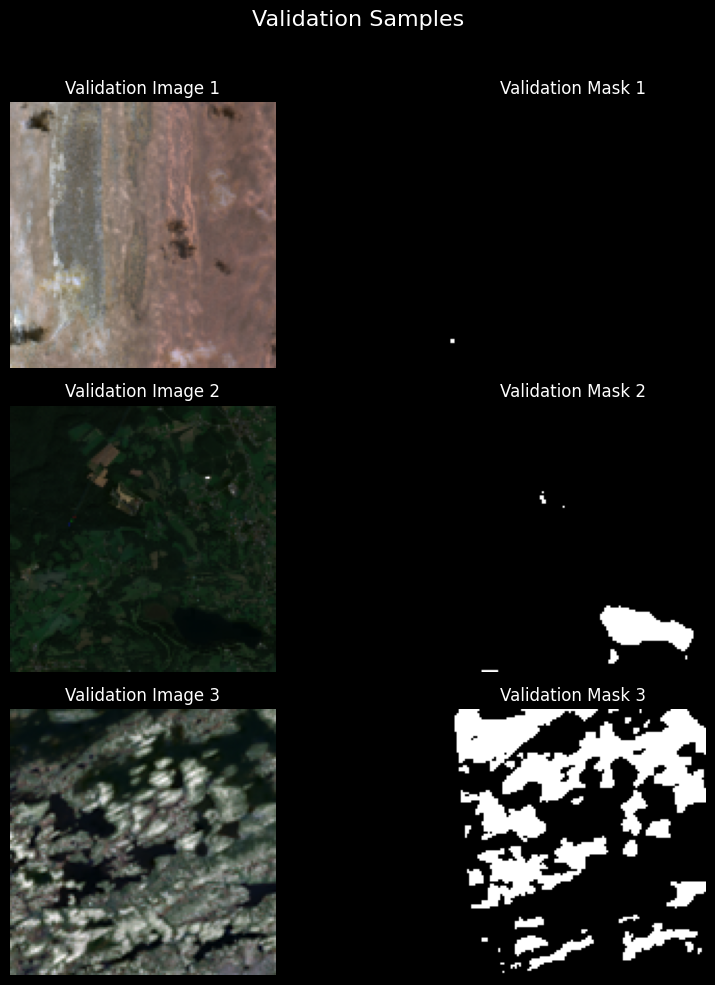

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.070336394..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.061459158..1.0].


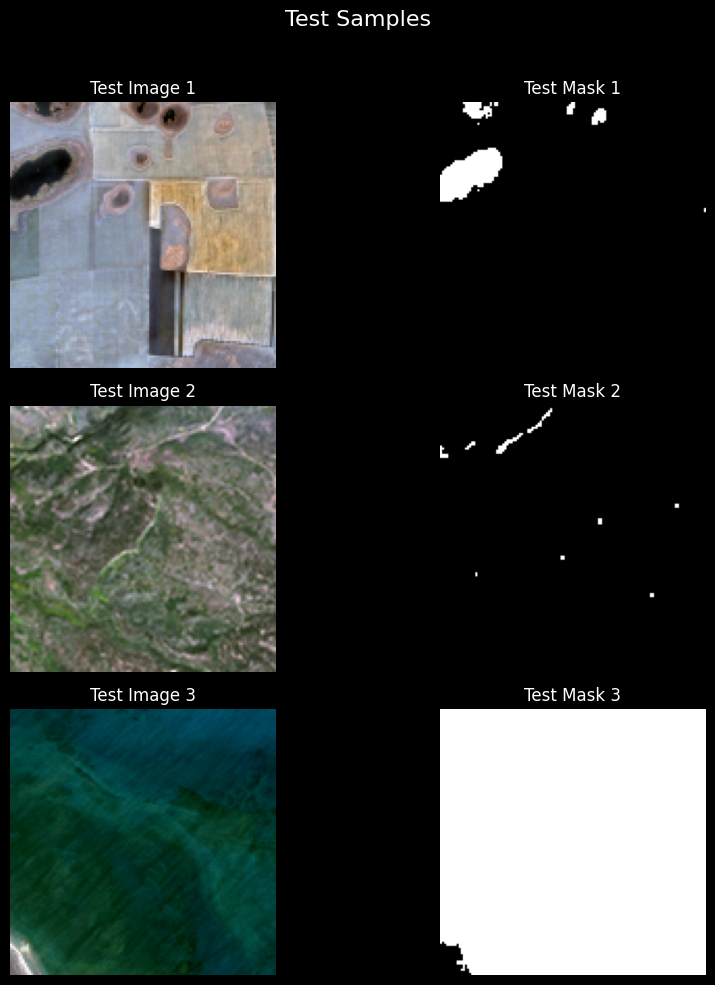

In [53]:
num_samples = 3

def plot_samples(X, y, dataset_name):
    indices = random.sample(range(len(X)), num_samples)
    
    fig, axes = plt.subplots(num_samples, 2, figsize=(10, 10))
    fig.suptitle(f'{dataset_name} Samples', fontsize=16)
    
    for i, idx in enumerate(indices):
     
        img = X[idx]
        mask = y[idx]
        red_band = img[:, :, 3]  # Band 3 - Red
        green_band = img[:, :, 2]  # Band 2 - Green
        blue_band = img[:, :, 1]  # Band 1 - Blue
        rgb_composite = np.stack([red_band, green_band, blue_band], axis=-1)        
             
        axes[i, 0].imshow(rgb_composite)
        axes[i, 0].set_title(f'{dataset_name} Image {i+1}')
        axes[i, 0].axis('off')
        
      
        axes[i, 1].imshow(mask, cmap='gray')
        axes[i, 1].set_title(f'{dataset_name} Mask {i+1}')
        axes[i, 1].axis('off')
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

# Plot 3 random samples from each dataset
plot_samples(X_train, y_train, 'Training')
plot_samples(X_val, y_val, 'Validation')
plot_samples(X_test, y_test, 'Test')


# Checking Nulls in images 

In [54]:
print(np.isnan(X_train).sum(), np.isinf(X_train).sum())
print(np.isnan(y_train).sum(), np.isinf(y_train).sum())
print(np.isnan(X_val).sum(), np.isinf(X_val).sum())
print(np.isnan(y_val).sum(), np.isinf(y_val).sum())

0 0
0 0
0 0
0 0


In [55]:
print(np.isnan(images).sum(), np.isinf(images).sum())
print(np.isnan(masks).sum(), np.isinf(masks).sum())
print(np.isnan(images_normalized).sum(), np.isinf(images_normalized).sum())

0 0
0 0
0 0


In [56]:
nan_indices_X_train = np.where(np.isnan(X_train))
nan_indices_y_train = np.where(np.isnan(y_train))
nan_indices_X_train

(array([], dtype=int64),
 array([], dtype=int64),
 array([], dtype=int64),
 array([], dtype=int64))

In [57]:
print("Shape of X_train[0]:", X_train[0].shape)
print("Shape of y_train[0]:", y_train[0].shape)
print("Shape of X_val[0]:", X_val[0].shape)
print("Shape of y_val[0]:", y_val[0].shape)

Shape of X_train[0]: (128, 128, 12)
Shape of y_train[0]: (128, 128)
Shape of X_val[0]: (128, 128, 12)
Shape of y_val[0]: (128, 128)


# **_Keras approch_**

In [23]:

from keras.layers import Input, Conv2D
from keras.models import Model
from keras.optimizers import Adam
from keras.regularizers import l2
import keras.backend as K


BACKBONE = 'resnet18'
preprocess_input = sm.get_preprocessing(BACKBONE)

base_model = sm.Unet(BACKBONE, encoder_weights='imagenet')

new_input = Input(shape=(128, 128, 12))
conv_layer = Conv2D(3, (3, 3), padding='same', activation='relu')(new_input)

pretrained_output = base_model(conv_layer)
def dice_loss(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.flatten(y_true)
    y_pred_f = tf.flatten(y_pred)
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

model = Model(inputs=new_input, outputs=pretrained_output)
model.compile(optimizer=Adam(),  loss='binary_crossentropy', metrics=['accuracy'])

# Summary of the model
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 128, 128, 12)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 128, 128, 3)    │           327 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ functional_1 (Functional)       │ (None, 128, 128, 1)    │    14,340,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,340,897 (54.71 MB)

 Trainable params: 14,330,971 (54.67 MB)

 Non-trainable params: 9,926 (38.77 KB)

In [ ]:
from tensorflow.keras import Input, Model
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.optimizers import Adam
import numpy as np
import segmentation_models as sm
from segmentation_models.losses import binary_crossentropy
from segmentation_models.metrics import FScore
from tensorflow.keras import backend as K

# Define the backbone (ResNet18) and load the pre-trained U-Net model
BACKBONE = 'resnet34'
preprocess_input = sm.get_preprocessing(BACKBONE)

# Base U-Net model
base_model = sm.Unet(backbone_name=BACKBONE, encoder_weights='imagenet')

# Input: (128, 128, 12) - Non-RGB image with 12 channels
inp = Input(shape=(128, 128, 12))

# Add a Conv2D layer to map 12 channels to 3 channels
l1 = Conv2D(3, (1, 1))(inp)

# Pass through the base U-Net model
out = base_model(l1)

# Define the complete model
model = Model(inp, out, name=base_model.name)

# Reshape the training labels to match the model output shape
y_train_reshaped = np.expand_dims(y_train, axis=-1)  # Adds a channel dimension
y_val_reshaped = np.expand_dims(y_val, axis=-1)
print(y_train_reshaped.shape)
def f1_score(y_true, y_pred):
    # Cast y_true to float32 to match y_pred
    y_true = K.cast(y_true, 'float32')
    y_pred = K.round(y_pred)  # Round predictions to 0 or 1
    
    # Compute true positives, false positives, false negatives
    tp = K.sum(K.cast(y_true * y_pred, 'float32'), axis=[1, 2, 3])  # True positives
    fp = K.sum(K.cast((1 - y_true) * y_pred, 'float32'), axis=[1, 2, 3])  # False positives
    fn = K.sum(K.cast(y_true * (1 - y_pred), 'float32'), axis=[1, 2, 3])  # False negatives

    # Calculate precision, recall, and F1 score
    precision = tp / (tp + fp + K.epsilon())
    recall = tp / (tp + fn + K.epsilon())
    f1 = 2 * precision * recall / (precision + recall + K.epsilon())
    
    return K.mean(f1)

def dice_coefficient(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.round(y_pred)
    intersection = K.sum(y_true * y_pred, axis=[1, 2, 3])
    union = K.sum(y_true, axis=[1, 2, 3]) + K.sum(y_pred, axis=[1, 2, 3])
    dice = (2. * intersection + K.epsilon()) / (union + K.epsilon())
    return K.mean(dice)    

# Compile the model with the custom F1-score and Dice coefficient
model.compile(optimizer=Adam(), loss='binary_crossentropy', metrics=[f1_score, dice_coefficient])

# Fit the model
history = model.fit(
   x=X_train,
   y=y_train_reshaped,
   batch_size=16,
   epochs=5,
   validation_data=(X_val, y_val_reshaped),
)

# To check predictions during training
def check_predictions(X_val, y_val_reshaped, model):
    predictions = model.predict(X_val)
    binary_predictions = (predictions > 0.5).astype(np.uint8)
    return binary_predictions

# Example of checking predictions
binary_predictions = check_predictions(X_val, y_val_reshaped, model)
print("Shape of binary predictions:", binary_predictions.shape)
# test_loss, test_accuracy = model.evaluate(X_test, y_test)
# print(f"Test Loss: {test_loss}")
# print(f"Test Accuracy: {test_accuracy}")

# Predictions (optional)
# predictions = model.predict(X_test)


(170, 128, 128, 1)
Epoch 1/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 28s 1s/step - dice_coefficient: 0.2137 - f1_score: 0.2060 - loss: 0.6009 - val_dice_coefficient: 0.2690 - val_f1_score: 0.2690 - val_loss: 16.6826
Epoch 2/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - dice_coefficient: 0.4958 - f1_score: 0.4118 - loss: 0.3602 - val_dice_coefficient: 0.2690 - val_f1_score: 0.2690 - val_loss: 5556.3550
Epoch 3/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 1s/step - dice_coefficient: 0.5351 - f1_score: 0.4008 - loss: 0.3175 - val_dice_coefficient: 0.2658 - val_f1_score: 0.2658 - val_loss: 22349.6504
Epoch 4/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - dice_coefficient: 0.5239 - f1_score: 0.4529 - loss: 0.3278 - val_dice_coefficient: 0.2690 - val_f1_score: 0.2690 - val_loss: 1334.0996
Epoch 5/5
11/11 ━━━━━━━━━━━━━━━━━━━━ 12s 1s/step - dice_coefficient: 0.5649 - f1_score: 0.4847 - loss: 0.3067 - val_dice_coefficient: 0.0255 - val_f1_score: 0.0255 - val_loss: 1.0259
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 807ms/step
Shape of binary 

In [ ]:
predictions = model.predict(X_val)
binary_predictions = (predictions > 0.5).astype(np.uint8)
print(binary_predictions[0].shape)

3/3 ━━━━━━━━━━━━━━━━━━━━ 1s 408ms/step
(128, 128, 1)


# **_Pytorch approch_** 

In [ ]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import segmentation_models_pytorch as smp
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score as f1_score_sklearn  # Import the f1_score function

import seaborn as sns
from sklearn.metrics import f1_score as f1_score_sklearn, accuracy_score, confusion_matrix, classification_report


# **_First Model Trial of the code_** 

Epoch 1/50, Loss: 0.6943740325815537
Dice coefficient: 0.330162912607193
Validation F1 Score: 0.3301629273114387
Validation Dice Coefficient: 0.330162912607193
Validation Accuracy: 0.4701274150126689
Epoch 2/50, Loss: 0.5517517265151529
Dice coefficient: 0.40346869826316833
Validation F1 Score: 0.4034686835094495
Validation Dice Coefficient: 0.40346869826316833
Validation Accuracy: 0.724818874049831
Epoch 3/50, Loss: 0.4641797935261446
Dice coefficient: 0.48736053705215454
Validation F1 Score: 0.4873605413593693
Validation Dice Coefficient: 0.48736053705215454
Validation Accuracy: 0.8088007746516047
Epoch 4/50, Loss: 0.4093687190729029
Dice coefficient: 0.5816606879234314
Validation F1 Score: 0.581660691026414
Validation Dice Coefficient: 0.5816606879234314
Validation Accuracy: 0.850063014674831
Epoch 5/50, Loss: 0.3639799012857325
Dice coefficient: 0.6368989944458008
Validation F1 Score: 0.6368990235474911
Validation Dice Coefficient: 0.6368989944458008
Validation Accuracy: 0.87449522

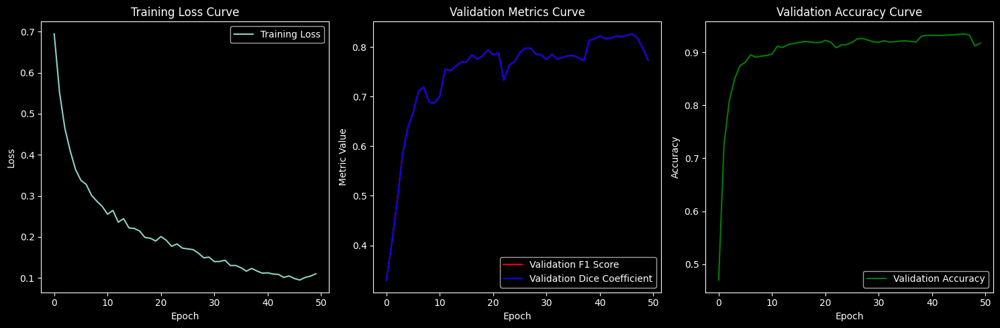

Dice coefficient: 0.8014710545539856
Test F1 Score: 0.8014710268281157
Test Dice Coefficient: 0.8014710545539856
Test Accuracy: 0.9148106728830645
Shape of binary predictions: (74, 1, 128, 128)


In [64]:
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import segmentation_models_pytorch as smp
from sklearn.metrics import f1_score as f1_score_sklearn  # Import the f1_score function


class UNetModel(nn.Module):
    def __init__(self):
        super(UNetModel, self).__init__()
        self.pre_conv = nn.Conv2d(12, 3, kernel_size=1)
        self.unet = smp.Unet(
            encoder_name='resnet34',
            encoder_weights='imagenet',
            in_channels=3,
            classes=1,
            activation=None
        )

    def forward(self, x):
        x = self.pre_conv(x)
        return self.unet(x)

class DiceCoefficient(nn.Module):
    def __init__(self):
        super(DiceCoefficient, self).__init__()

    def forward(self, y_pred, y_true):
        y_pred = y_pred > 0.5 
        y_true = y_true.byte()  
     
        y_pred_flat = torch.flatten(y_pred)
        y_true_flat = torch.flatten(y_true)
        
        intersection = torch.sum(y_pred_flat * y_true_flat).float()
        union = torch.sum(y_pred_flat) + torch.sum(y_true_flat).float()
        
        
        dice = (2. * intersection + 1e-8) / (union + 1e-8)
        
        # Print values for debugging
        # print(f"Intersection: {intersection.item()}")
        # print(f"Union: {union.item()}")
        print(f"Dice coefficient: {dice.item()}")  # Debugging line
        
        return dice


def prepare_data(X_train, y_train, X_val, y_val):

    X_train_tensor = torch.tensor(X_train, dtype=torch.float32).permute(0, 3, 1, 2)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).squeeze(-1)  # Remove any extra channel dimension
    X_val_tensor = torch.tensor(X_val, dtype=torch.float32).permute(0, 3, 1, 2)
    y_val_tensor = torch.tensor(y_val, dtype=torch.float32).squeeze(-1)  # Remove any extra channel dimension
    
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    
    return train_loader, val_loader


from sklearn.metrics import f1_score as f1_score_sklearn

def calculate_f1_score(y_true, y_pred):
    return f1_score_sklearn(y_true.flatten(), y_pred.flatten() > 0.5)

from sklearn.metrics import accuracy_score

def calculate_accuracy(y_true, y_pred):
    return accuracy_score(y_true.flatten(), y_pred.flatten() > 0.5)

def train(model, train_loader, val_loader, num_epochs=50):
    criterion = nn.BCEWithLogitsLoss()  # Define BCEWithLogitsLoss directly
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
   
    dice_coeff = DiceCoefficient()
    
    train_losses = []
    val_f1_scores = []
    val_dice_coeffs = []
    val_accuracies = []
    
    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)  # Raw logits from the model
            
            # # Print shapes for debugging
            # print("Labels shape before squeeze:", labels.shape)
            # print("Outputs shape before squeeze:", outputs.shape)
            
            # Ensure labels and outputs have the same shape
            if labels.shape != outputs.shape:
                # Align labels with the shape of outputs
                labels = labels.view_as(outputs)  # This will adjust the shape of labels to match the outputs
            
            # print("Labels shape after alignment:", labels.shape)
            # print("Outputs shape after alignment:", outputs.shape)
            
            loss = criterion(outputs, labels)  # Calculate BCE Loss
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)
        
        epoch_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_loss)
        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss}')
        
        model.eval()
        with torch.no_grad():
            all_preds = []
            all_labels = []
            for inputs, labels in val_loader:
                outputs = model(inputs)
                preds = torch.sigmoid(outputs)  # Apply sigmoid to logits for evaluation
                
                # Ensure shapes match by aligning if needed
                if labels.shape != preds.shape:
                    labels = labels.view_as(preds)  # Adjust the shape of labels to match the predictions
                
                all_preds.append(preds.cpu().numpy())
                all_labels.append(labels.cpu().numpy())
            
            all_preds = np.concatenate(all_preds)
            all_labels = np.concatenate(all_labels)
            
            val_f1_score = calculate_f1_score(all_labels, all_preds)
            val_dice = dice_coeff(torch.tensor(all_preds), torch.tensor(all_labels))
            val_accuracy = calculate_accuracy(all_labels, all_preds)
            
            val_f1_scores.append(val_f1_score)
            val_dice_coeffs.append(val_dice.item())
            val_accuracies.append(val_accuracy)
            
            print(f'Validation F1 Score: {val_f1_score}')
            print(f'Validation Dice Coefficient: {val_dice.item()}')
            print(f'Validation Accuracy: {val_accuracy}')

    # Plot learning curves
    plt.figure(figsize=(15, 5))

    # Plot training loss
    plt.subplot(1, 3, 1)
    plt.plot(train_losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss Curve')
    plt.legend()

    # Plot validation metrics
    plt.subplot(1, 3, 2)
    plt.plot(val_f1_scores, label='Validation F1 Score', color='r')
    plt.plot(val_dice_coeffs, label='Validation Dice Coefficient', color='b')
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')
    plt.title('Validation Metrics Curve')
    plt.legend()

    # Plot validation accuracy
    plt.subplot(1, 3, 3)
    plt.plot(val_accuracies, label='Validation Accuracy', color='g')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Validation Accuracy Curve')
    plt.legend()

    plt.tight_layout()
    plt.show()

def evaluate_on_test(model, test_loader):
    model.eval()
    with torch.no_grad():
        all_preds = []
        all_labels = []
        for inputs, labels in test_loader:
            outputs = model(inputs)
            preds = torch.sigmoid(outputs)  # Apply sigmoid to logits for evaluation
            
            # Ensure shapes match
            if labels.shape != preds.shape:
                labels = labels.view_as(preds)
            
            all_preds.append(preds.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
        
        all_preds = np.concatenate(all_preds)
        all_labels = np.concatenate(all_labels)
        
        test_f1_score = calculate_f1_score(all_labels, all_preds)
        test_dice = DiceCoefficient()(torch.tensor(all_preds), torch.tensor(all_labels))
        test_accuracy = calculate_accuracy(all_labels, all_preds)
        
        print(f'Test F1 Score: {test_f1_score}')
        print(f'Test Dice Coefficient: {test_dice.item()}')
        print(f'Test Accuracy: {test_accuracy}')


def prepare_test_data(X_test, y_test):
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32).permute(0, 3, 1, 2)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float32).squeeze(-1)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
    return test_loader


if __name__ == "__main__":
    y_train_reshaped = np.expand_dims(y_train, axis=-1)
    y_val_reshaped = np.expand_dims(y_val, axis=-1)
    y_test_reshaped = np.expand_dims(y_test, axis=-1)

    train_loader, val_loader = prepare_data(X_train, y_train_reshaped, X_val, y_val_reshaped)
    test_loader = prepare_test_data(X_test, y_test_reshaped)

    model = UNetModel()
    train(model, train_loader, val_loader)
    
    evaluate_on_test(model, test_loader)

    binary_predictions = check_predictions(model, X_val)
    print("Shape of binary predictions:", binary_predictions.shape)



Epoch 1/50, Loss: 0.8448805816033307
Training F1 Score: 0.46803876259403043
Training Dice Coefficient: 0.46803876757621765
Training Accuracy: 0.42391429227941174
Validation F1 Score: 0.3469402842790495
Validation Dice Coefficient: 0.346940279006958
Validation Accuracy: 0.30784070813978043
Epoch 2/50, Loss: 0.6635669834473554
Training F1 Score: 0.5528096521124916
Training Dice Coefficient: 0.5528096556663513
Training Accuracy: 0.5735796760110294
Validation F1 Score: 0.3923982724533942
Validation Dice Coefficient: 0.39239826798439026
Validation Accuracy: 0.46286340661951014
Epoch 3/50, Loss: 0.5636291146278382
Training F1 Score: 0.6616209904092855
Training Dice Coefficient: 0.6616209745407104
Training Accuracy: 0.7382431927849264
Validation F1 Score: 0.5235879484513737
Validation Dice Coefficient: 0.5235879421234131
Validation Accuracy: 0.6972532530088682
Epoch 4/50, Loss: 0.4948123441022985
Training F1 Score: 0.7584687494419108
Training Dice Coefficient: 0.758468747138977
Training Accur

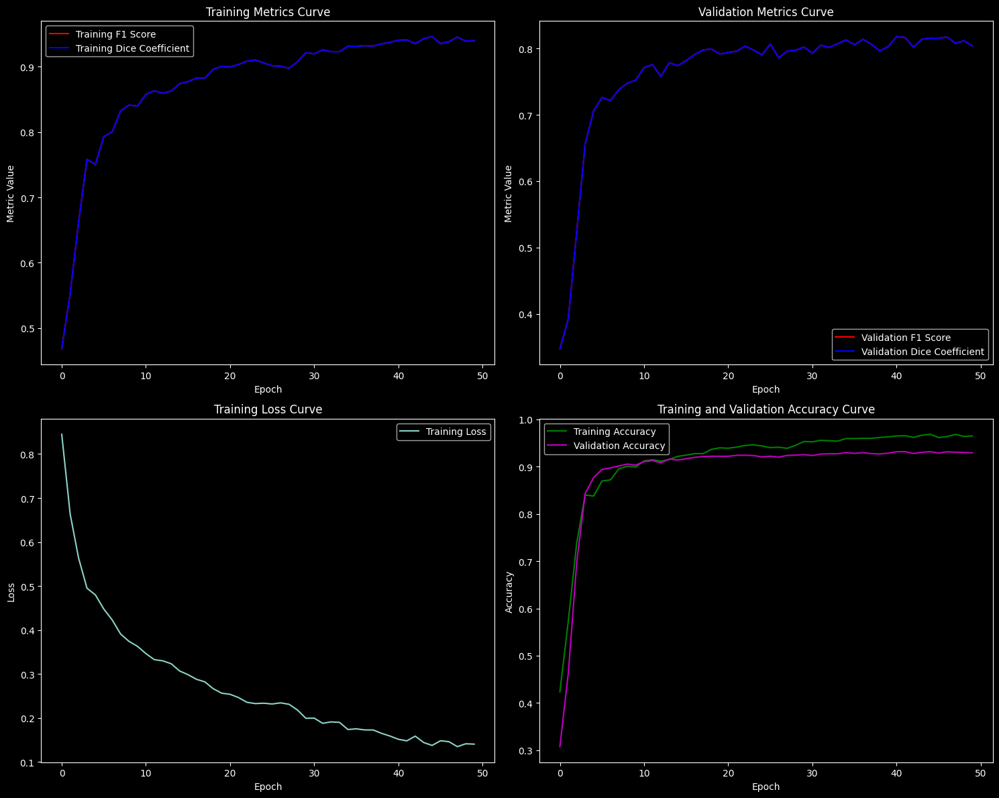

Test F1 Score: 0.8590156157704001
Test Dice Coefficient: 0.8590156435966492
Test Accuracy: 0.9391449959047379


In [68]:
class UNetModel(nn.Module):
    def __init__(self):
        super(UNetModel, self).__init__()
        self.pre_conv = nn.Conv2d(12, 3, kernel_size=1)
        self.unet = smp.Unet(
            encoder_name='resnet34',
            encoder_weights='imagenet',
            in_channels=3,
            classes=1,
            activation=None
        )

    def forward(self, x):
        x = self.pre_conv(x)
        return self.unet(x)


class DiceCoefficient(nn.Module):
    def __init__(self):
        super(DiceCoefficient, self).__init__()

    def forward(self, y_pred, y_true):
        y_pred = y_pred > 0.5 
        y_true = y_true.byte()  
     
        y_pred_flat = torch.flatten(y_pred)
        y_true_flat = torch.flatten(y_true)
        
        intersection = torch.sum(y_pred_flat * y_true_flat).float()
        union = torch.sum(y_pred_flat) + torch.sum(y_true_flat).float()
        
        dice = (2. * intersection + 1e-8) / (union + 1e-8)
        return dice


def prepare_data(X_train, y_train, X_val, y_val):
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32).permute(0, 3, 1, 2)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).squeeze(-1)  
    X_val_tensor = torch.tensor(X_val, dtype=torch.float32).permute(0, 3, 1, 2)
    y_val_tensor = torch.tensor(y_val, dtype=torch.float32).squeeze(-1)  
    
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    
    return train_loader, val_loader


def calculate_f1_score(y_true, y_pred):
    return f1_score_sklearn(y_true.flatten(), y_pred.flatten() > 0.5)

def calculate_accuracy(y_true, y_pred):
    return accuracy_score(y_true.flatten(), y_pred.flatten() > 0.5)


def train(model, train_loader, val_loader, num_epochs=50):
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    dice_coeff = DiceCoefficient()

    train_losses = []
    train_f1_scores = []
    train_dice_coeffs = []
    train_accuracies = []
    
    val_f1_scores = []
    val_dice_coeffs = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        all_train_preds = []
        all_train_labels = []

        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            
            if labels.shape != outputs.shape:
                labels = labels.view_as(outputs)
            
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)

            preds = torch.sigmoid(outputs).detach().cpu().numpy()
            labels = labels.detach().cpu().numpy()

            all_train_preds.append(preds)
            all_train_labels.append(labels)

        epoch_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_loss)

        all_train_preds = np.concatenate(all_train_preds)
        all_train_labels = np.concatenate(all_train_labels)
        train_f1_score = calculate_f1_score(all_train_labels, all_train_preds)
        train_dice = dice_coeff(torch.tensor(all_train_preds), torch.tensor(all_train_labels))
        train_accuracy = calculate_accuracy(all_train_labels, all_train_preds)

        train_f1_scores.append(train_f1_score)
        train_dice_coeffs.append(train_dice.item())
        train_accuracies.append(train_accuracy)

        print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss}')
        print(f'Training F1 Score: {train_f1_score}')
        print(f'Training Dice Coefficient: {train_dice.item()}')
        print(f'Training Accuracy: {train_accuracy}')

        model.eval()
        with torch.no_grad():
            all_preds = []
            all_labels = []
            for inputs, labels in val_loader:
                outputs = model(inputs)
                preds = torch.sigmoid(outputs).detach().cpu().numpy()
                labels = labels.detach().cpu().numpy()
                
                if labels.shape != preds.shape:
                    labels = labels.reshape(preds.shape)
                
                all_preds.append(preds)
                all_labels.append(labels)

            all_preds = np.concatenate(all_preds)
            all_labels = np.concatenate(all_labels)
            
            val_f1_score = calculate_f1_score(all_labels, all_preds)
            val_dice = dice_coeff(torch.tensor(all_preds), torch.tensor(all_labels))
            val_accuracy = calculate_accuracy(all_labels, all_preds)
            
            val_f1_scores.append(val_f1_score)
            val_dice_coeffs.append(val_dice.item())
            val_accuracies.append(val_accuracy)
            
            print(f'Validation F1 Score: {val_f1_score}')
            print(f'Validation Dice Coefficient: {val_dice.item()}')
            print(f'Validation Accuracy: {val_accuracy}')

    plt.figure(figsize=(15, 12))

    plt.subplot(2, 2, 1)
    plt.plot(train_f1_scores, label='Training F1 Score', color='r')
    plt.plot(train_dice_coeffs, label='Training Dice Coefficient', color='b')
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')
    plt.title('Training Metrics Curve')
    plt.legend()

    plt.subplot(2, 2, 2)
    plt.plot(val_f1_scores, label='Validation F1 Score', color='r')
    plt.plot(val_dice_coeffs, label='Validation Dice Coefficient', color='b')
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')
    plt.title('Validation Metrics Curve')
    plt.legend()

    plt.subplot(2, 2, 3)
    plt.plot(train_losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss Curve')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(train_accuracies, label='Training Accuracy', color='g')
    plt.plot(val_accuracies, label='Validation Accuracy', color='m')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy Curve')
    plt.legend()

    plt.tight_layout()
    plt.show()



def evaluate_on_test(model, test_loader):
    model.eval()
    with torch.no_grad():
        all_preds = []
        all_labels = []
        for inputs, labels in test_loader:
            outputs = model(inputs)
            preds = torch.sigmoid(outputs)  
            
            if labels.shape != preds.shape:
                labels = labels.view_as(preds)
            
            all_preds.append(preds.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
        
        all_preds = np.concatenate(all_preds)
        all_labels = np.concatenate(all_labels)
        
        test_f1_score = calculate_f1_score(all_labels, all_preds)
        test_dice = DiceCoefficient()(torch.tensor(all_preds), torch.tensor(all_labels))
        test_accuracy = calculate_accuracy(all_labels, all_preds)
        
        print(f'Test F1 Score: {test_f1_score}')
        print(f'Test Dice Coefficient: {test_dice.item()}')
        print(f'Test Accuracy: {test_accuracy}')


def prepare_test_data(X_test, y_test):
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32).permute(0, 3, 1, 2)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float32).squeeze(-1)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
    return test_loader


if __name__ == "__main__":
    y_train_reshaped = np.expand_dims(y_train, axis=-1)
    y_val_reshaped = np.expand_dims(y_val, axis=-1)
    y_test_reshaped = np.expand_dims(y_test, axis=-1)

    train_loader, val_loader = prepare_data(X_train, y_train_reshaped, X_val, y_val_reshaped)
    test_loader = prepare_test_data(X_test, y_test_reshaped)

    model = UNetModel()
    train(model, train_loader, val_loader)
    
    evaluate_on_test(model, test_loader)

# **_General Class_**

* **_EfficentNet and ResNet_**

Training with encoder: resnet34


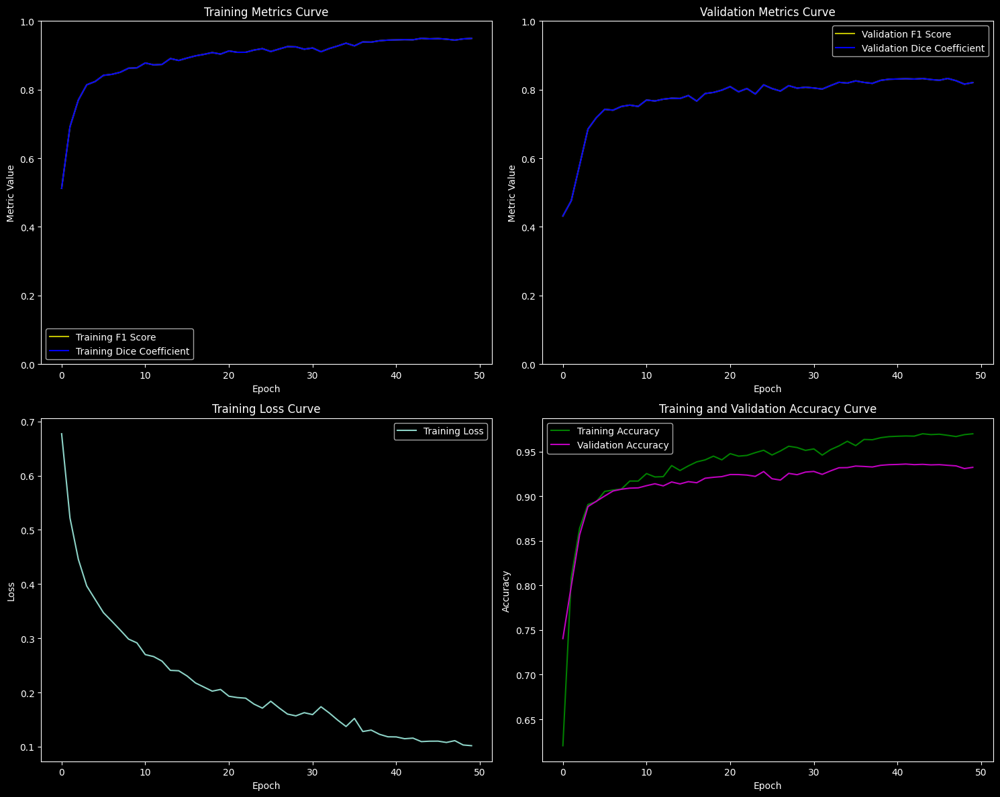

Test F1 Score: 0.8449516929236661
Test Dice Coefficient: 0.8449516892433167
Test Accuracy: 0.9298548544606855
Test Confusion Matrix:


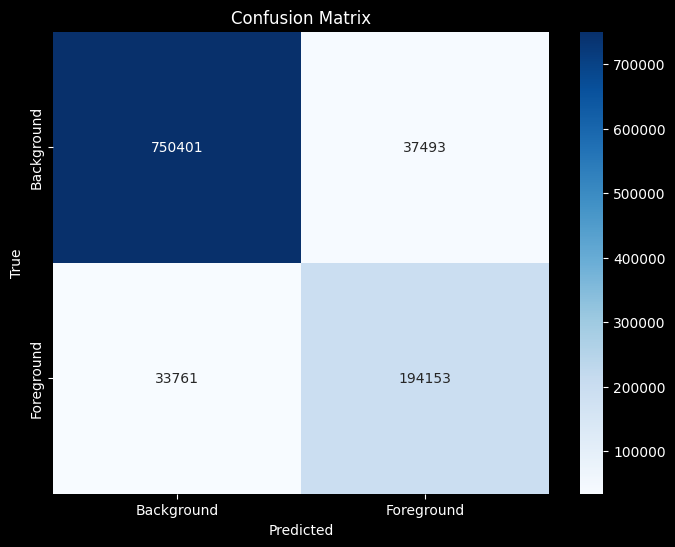

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.95      0.95    787894
         1.0       0.84      0.85      0.84    227914

    accuracy                           0.93   1015808
   macro avg       0.90      0.90      0.90   1015808
weighted avg       0.93      0.93      0.93   1015808

Model (resnet34) is done 
Training with encoder: efficientnet-b3


Downloading: "https://github.com/lukemelas/EfficientNet-PyTorch/releases/download/1.0/efficientnet-b3-5fb5a3c3.pth" to C:\Users\salma.muhammad/.cache\torch\hub\checkpoints\efficientnet-b3-5fb5a3c3.pth
100%|██████████| 47.1M/47.1M [00:39<00:00, 1.26MB/s]


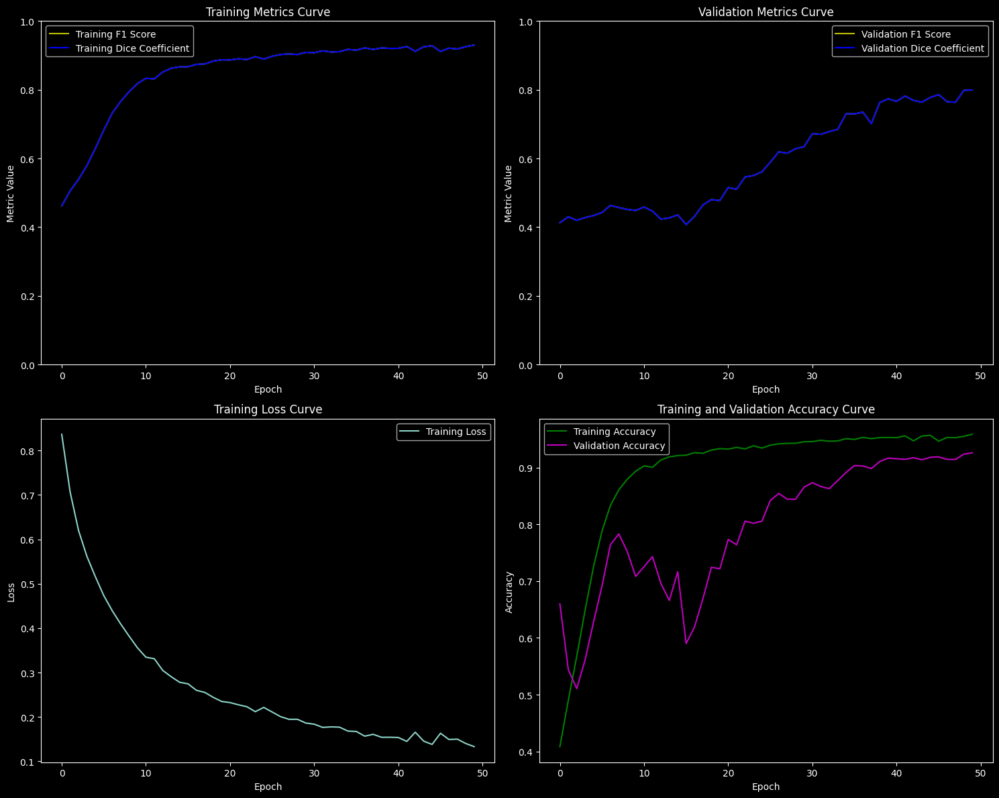

Test F1 Score: 0.8213107234940752
Test Dice Coefficient: 0.8213106989860535
Test Accuracy: 0.9209949124243951
Test Confusion Matrix:


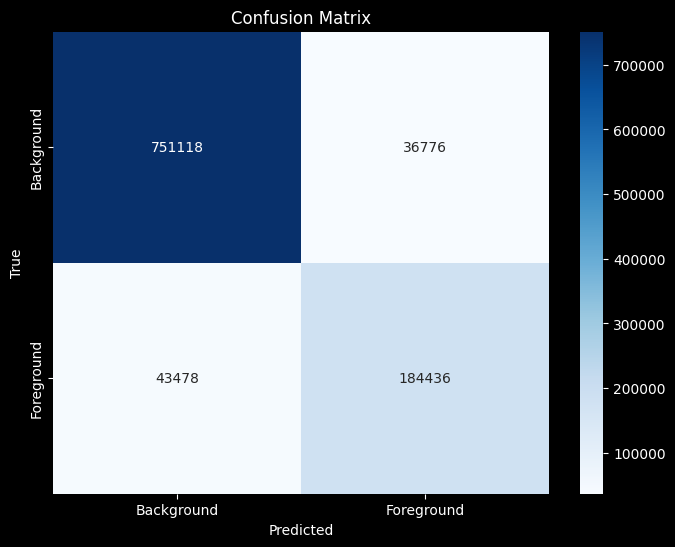

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.95      0.95      0.95    787894
         1.0       0.83      0.81      0.82    227914

    accuracy                           0.92   1015808
   macro avg       0.89      0.88      0.89   1015808
weighted avg       0.92      0.92      0.92   1015808

Model (efficientnet-b3) is done 
Training with encoder: inceptionv3


KeyError: "Wrong encoder name `inceptionv3`, supported encoders: ['resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'resnext50_32x4d', 'resnext101_32x4d', 'resnext101_32x8d', 'resnext101_32x16d', 'resnext101_32x32d', 'resnext101_32x48d', 'dpn68', 'dpn68b', 'dpn92', 'dpn98', 'dpn107', 'dpn131', 'vgg11', 'vgg11_bn', 'vgg13', 'vgg13_bn', 'vgg16', 'vgg16_bn', 'vgg19', 'vgg19_bn', 'senet154', 'se_resnet50', 'se_resnet101', 'se_resnet152', 'se_resnext50_32x4d', 'se_resnext101_32x4d', 'densenet121', 'densenet169', 'densenet201', 'densenet161', 'inceptionresnetv2', 'inceptionv4', 'efficientnet-b0', 'efficientnet-b1', 'efficientnet-b2', 'efficientnet-b3', 'efficientnet-b4', 'efficientnet-b5', 'efficientnet-b6', 'efficientnet-b7', 'mobilenet_v2', 'xception', 'timm-efficientnet-b0', 'timm-efficientnet-b1', 'timm-efficientnet-b2', 'timm-efficientnet-b3', 'timm-efficientnet-b4', 'timm-efficientnet-b5', 'timm-efficientnet-b6', 'timm-efficientnet-b7', 'timm-efficientnet-b8', 'timm-efficientnet-l2', 'timm-tf_efficientnet_lite0', 'timm-tf_efficientnet_lite1', 'timm-tf_efficientnet_lite2', 'timm-tf_efficientnet_lite3', 'timm-tf_efficientnet_lite4', 'timm-resnest14d', 'timm-resnest26d', 'timm-resnest50d', 'timm-resnest101e', 'timm-resnest200e', 'timm-resnest269e', 'timm-resnest50d_4s2x40d', 'timm-resnest50d_1s4x24d', 'timm-res2net50_26w_4s', 'timm-res2net101_26w_4s', 'timm-res2net50_26w_6s', 'timm-res2net50_26w_8s', 'timm-res2net50_48w_2s', 'timm-res2net50_14w_8s', 'timm-res2next50', 'timm-regnetx_002', 'timm-regnetx_004', 'timm-regnetx_006', 'timm-regnetx_008', 'timm-regnetx_016', 'timm-regnetx_032', 'timm-regnetx_040', 'timm-regnetx_064', 'timm-regnetx_080', 'timm-regnetx_120', 'timm-regnetx_160', 'timm-regnetx_320', 'timm-regnety_002', 'timm-regnety_004', 'timm-regnety_006', 'timm-regnety_008', 'timm-regnety_016', 'timm-regnety_032', 'timm-regnety_040', 'timm-regnety_064', 'timm-regnety_080', 'timm-regnety_120', 'timm-regnety_160', 'timm-regnety_320', 'timm-skresnet18', 'timm-skresnet34', 'timm-skresnext50_32x4d', 'timm-mobilenetv3_large_075', 'timm-mobilenetv3_large_100', 'timm-mobilenetv3_large_minimal_100', 'timm-mobilenetv3_small_075', 'timm-mobilenetv3_small_100', 'timm-mobilenetv3_small_minimal_100', 'timm-gernet_s', 'timm-gernet_m', 'timm-gernet_l', 'mit_b0', 'mit_b1', 'mit_b2', 'mit_b3', 'mit_b4', 'mit_b5', 'mobileone_s0', 'mobileone_s1', 'mobileone_s2', 'mobileone_s3', 'mobileone_s4']"

In [89]:


# Step 1: Our pretrainined Backbone
class UNetModel(nn.Module):
    def __init__(self, encoder_name):
        super(UNetModel, self).__init__()
        self.pre_conv = nn.Conv2d(12, 3, kernel_size=1) # convert from 12 channel to 3
        self.unet = smp.Unet(
            encoder_name=encoder_name,
            encoder_weights='imagenet',
            in_channels=3,
            classes=1,
            activation=None
        )

    def forward(self, x):
        x = self.pre_conv(x)
        return self.unet(x)

#################################################

# Step2: our Metrics
class DiceCoefficient(nn.Module):
    def __init__(self):
        super(DiceCoefficient, self).__init__()

    def forward(self, y_pred, y_true):
        y_pred = y_pred > 0.5 
        y_true = y_true.byte()  
     
        y_pred_flat = torch.flatten(y_pred)
        y_true_flat = torch.flatten(y_true)
        
        intersection = torch.sum(y_pred_flat * y_true_flat).float()
        union = torch.sum(y_pred_flat) + torch.sum(y_true_flat).float()
        
        dice = (2. * intersection + 1e-8) / (union + 1e-8)
        return dice
#############################################################
# Step3:  Preparing our dataset

def prepare_data(X_train, y_train, X_val, y_val):
    X_train_tensor = torch.tensor(X_train, dtype=torch.float32).permute(0, 3, 1, 2)
    y_train_tensor = torch.tensor(y_train, dtype=torch.float32).squeeze(-1)
    X_val_tensor = torch.tensor(X_val, dtype=torch.float32).permute(0, 3, 1, 2)
    y_val_tensor = torch.tensor(y_val, dtype=torch.float32).squeeze(-1)
    
    train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(X_val_tensor, y_val_tensor)

    train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)
    
    return train_loader, val_loader

#############################################################
# Additional acuuracies
def calculate_f1_score(y_true, y_pred):
    return f1_score_sklearn(y_true.flatten(), y_pred.flatten() > 0.5)

def calculate_accuracy(y_true, y_pred):
    return accuracy_score(y_true.flatten(), y_pred.flatten() > 0.5)

#############################################################
# Step4: Our training Process

def train(model, train_loader, val_loader, num_epochs=50):
    criterion = nn.BCEWithLogitsLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    dice_coeff = DiceCoefficient()

    train_losses = []
    train_f1_scores = []
    train_dice_coeffs = []
    train_accuracies = []

    val_f1_scores = []
    val_dice_coeffs = []
    val_accuracies = []

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0
        all_train_preds = []
        all_train_labels = []

        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)

            if labels.shape != outputs.shape:
                labels = labels.view_as(outputs)

            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * inputs.size(0)

            preds = torch.sigmoid(outputs).detach().cpu().numpy()
            labels = labels.detach().cpu().numpy()

            all_train_preds.append(preds)
            all_train_labels.append(labels)

        epoch_loss = running_loss / len(train_loader.dataset)
        train_losses.append(epoch_loss)

        all_train_preds = np.concatenate(all_train_preds)
        all_train_labels = np.concatenate(all_train_labels)

        # Debugging prints
        # print(f'Shape of all_train_preds: {all_train_preds.shape}')
        # print(f'Shape of all_train_labels: {all_train_labels.shape}')
        
        train_f1_score = calculate_f1_score(all_train_labels, all_train_preds)
        train_dice = dice_coeff(torch.tensor(all_train_preds), torch.tensor(all_train_labels))
        train_accuracy = calculate_accuracy(all_train_labels, all_train_preds)

        train_f1_scores.append(train_f1_score)
        train_dice_coeffs.append(train_dice.item())
        train_accuracies.append(train_accuracy)

        # print(f'Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss}')
        # print(f'Training F1 Score: {train_f1_score}')
        # print(f'Training Dice Coefficient: {train_dice.item()}')
        # print(f'Training Accuracy: {train_accuracy}')

        model.eval()
        with torch.no_grad():
            all_preds = []
            all_labels = []
            for inputs, labels in val_loader:
                outputs = model(inputs)
                preds = torch.sigmoid(outputs).detach().cpu().numpy()
                labels = labels.detach().cpu().numpy()

                if labels.shape != preds.shape:
                    labels = labels.reshape(preds.shape)

                all_preds.append(preds)
                all_labels.append(labels)

            all_preds = np.concatenate(all_preds)
            all_labels = np.concatenate(all_labels)

            # # Debugging prints
            # print(f'Shape of all_preds: {all_preds.shape}')
            # print(f'Shape of all_labels: {all_labels.shape}')

            val_f1_score = calculate_f1_score(all_labels, all_preds)
            val_dice = dice_coeff(torch.tensor(all_preds), torch.tensor(all_labels))
            val_accuracy = calculate_accuracy(all_labels, all_preds)

            val_f1_scores.append(val_f1_score)
            val_dice_coeffs.append(val_dice.item())
            val_accuracies.append(val_accuracy)
            # print(len(val_f1_scores))
            # print(f'Validation F1 Score: {val_f1_score}')
            # print(f'Validation Dice Coefficient: {val_dice.item()}')
            # print(f'Validation Accuracy: {val_accuracy}')

    plt.figure(figsize=(15, 12))

    plt.subplot(2, 2, 1)
    plt.plot(train_f1_scores, label='Training F1 Score', color='y')
    plt.plot(train_dice_coeffs, label='Training Dice Coefficient', color='b')
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')
    plt.title('Training Metrics Curve')
    plt.legend()
    plt.ylim([0, 1])  # Set y-axis limits for better visibility

    plt.subplot(2, 2, 2)
    plt.plot(val_f1_scores, label='Validation F1 Score', color='y')
    plt.plot(val_dice_coeffs, label='Validation Dice Coefficient', color='b')
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')
    plt.title('Validation Metrics Curve')
    plt.legend()
    plt.ylim([0, 1])  # Set y-axis limits for better visibility

    plt.subplot(2, 2, 3)
    plt.plot(train_losses, label='Training Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training Loss Curve')
    plt.legend()

    plt.subplot(2, 2, 4)
    plt.plot(train_accuracies, label='Training Accuracy', color='g')
    plt.plot(val_accuracies, label='Validation Accuracy', color='m')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.title('Training and Validation Accuracy Curve')
    plt.legend()

    plt.tight_layout()
    plt.show()




def evaluate_on_test(model, test_loader):
    model.eval()
    with torch.no_grad():
        all_preds = []
        all_labels = []
        for inputs, labels in test_loader:
            outputs = model(inputs)
            preds = torch.sigmoid(outputs)  
            
            if labels.shape != preds.shape:
                labels = labels.view_as(preds)
            
            all_preds.append(preds.cpu().numpy())
            all_labels.append(labels.cpu().numpy())
        
        all_preds = np.concatenate(all_preds)
        all_labels = np.concatenate(all_labels)
        
        test_f1_score = calculate_f1_score(all_labels, all_preds)
        test_dice = DiceCoefficient()(torch.tensor(all_preds), torch.tensor(all_labels))
        test_accuracy = calculate_accuracy(all_labels, all_preds)
        
        print(f'Test F1 Score: {test_f1_score}')
        print(f'Test Dice Coefficient: {test_dice.item()}')
        print(f'Test Accuracy: {test_accuracy}')

        # Confusion Matrix and Classification Report
        test_preds_binary = (all_preds > 0.5).astype(int)
        test_conf_matrix = confusion_matrix(all_labels.flatten(), test_preds_binary.flatten())
        test_class_report = classification_report(all_labels.flatten(), test_preds_binary.flatten())

        print("Test Confusion Matrix:")
        plot_confusion_matrix(test_conf_matrix, class_names=['Background', 'Foreground'])
        print("Test Classification Report:")
        print(test_class_report)



def prepare_test_data(X_test, y_test):
    X_test_tensor = torch.tensor(X_test, dtype=torch.float32).permute(0, 3, 1, 2)
    y_test_tensor = torch.tensor(y_test, dtype=torch.float32).squeeze(-1)
    test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
    test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
    return test_loader


if __name__ == "__main__":



    encoders = [
        'resnet34',          # ResNet
        'efficientnet-b3',   # EfficientNet
        # 'inceptionv3',       # Inception
        'vgg16',             # VGG
        'mobilenet_v2'       # MobileNet
    ]

    for encoder in encoders:
        print(f"Training with encoder: {encoder}")
        model = UNetModel(encoder_name=encoder)
        train(model, train_loader, val_loader)
        evaluate_on_test(model, test_loader)
        print(f'Model ({encoder}) is done ') 


* # **_VGG16 Family_**

Training with encoder: vgg16


Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to C:\Users\salma.muhammad/.cache\torch\hub\checkpoints\vgg16-397923af.pth
100%|██████████| 528M/528M [06:43<00:00, 1.37MB/s] 


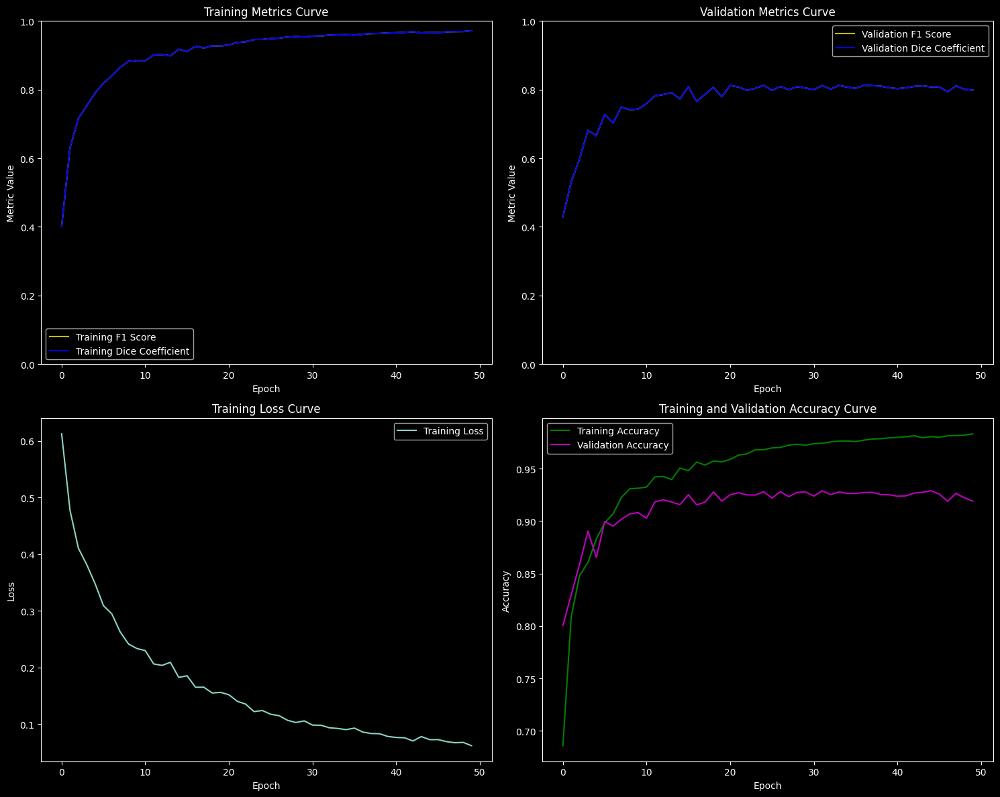

Test F1 Score: 0.861738596958016
Test Dice Coefficient: 0.8617386221885681
Test Accuracy: 0.9381014916204637
Test Confusion Matrix:


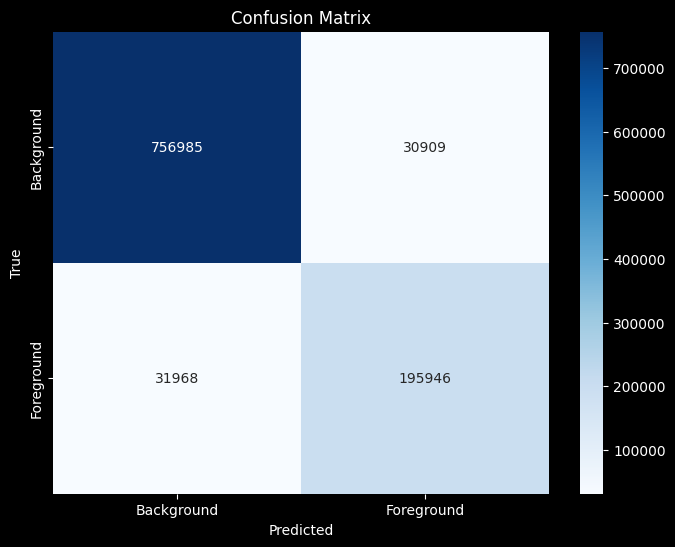

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.96      0.96      0.96    787894
         1.0       0.86      0.86      0.86    227914

    accuracy                           0.94   1015808
   macro avg       0.91      0.91      0.91   1015808
weighted avg       0.94      0.94      0.94   1015808

Model (vgg16) is done 


In [92]:
if __name__ == "__main__":



    encoders = [

    
        'vgg16',             # VGG
  
    ]

    for encoder in encoders:
        print(f"Training with encoder: {encoder}")
        model = UNetModel(encoder_name=encoder)
        train(model, train_loader, val_loader)
        evaluate_on_test(model, test_loader)
        print(f'Model ({encoder}) is done ') 


* # **_MobileNet Family_** 

Training with encoder: mobilenet_v2


Downloading: "https://download.pytorch.org/models/mobilenet_v2-b0353104.pth" to C:\Users\salma.muhammad/.cache\torch\hub\checkpoints\mobilenet_v2-b0353104.pth
100%|██████████| 13.6M/13.6M [00:07<00:00, 1.93MB/s]


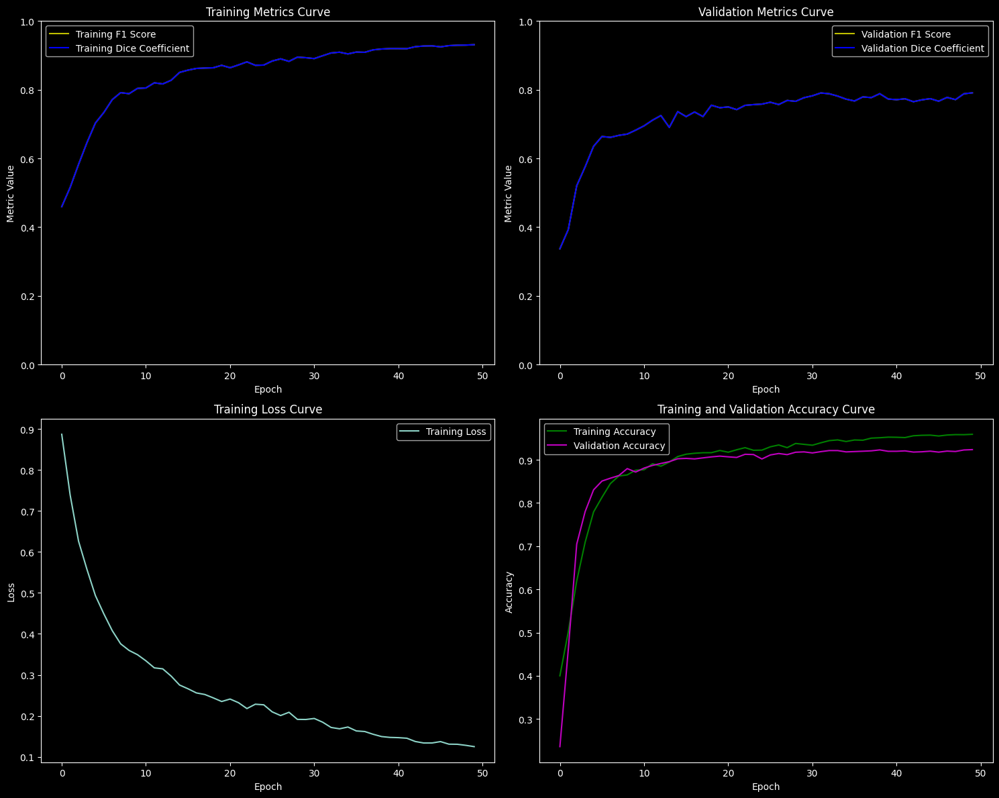

Test F1 Score: 0.8164024036303561
Test Dice Coefficient: 0.8164023756980896
Test Accuracy: 0.9230907809349799
Test Confusion Matrix:


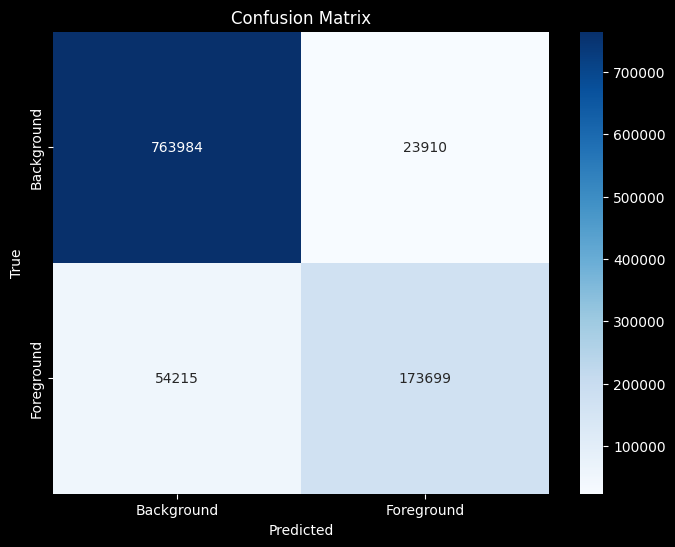

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95    787894
         1.0       0.88      0.76      0.82    227914

    accuracy                           0.92   1015808
   macro avg       0.91      0.87      0.88   1015808
weighted avg       0.92      0.92      0.92   1015808

Model (mobilenet_v2) is done 


In [93]:
if __name__ == "__main__":
    encoders = [    
        'mobilenet_v2',            # VGG  
    ]

    for encoder in encoders:
        print(f"Training with encoder: {encoder}")
        model = UNetModel(encoder_name=encoder)
        train(model, train_loader, val_loader)
        evaluate_on_test(model, test_loader)
        print(f'Model ({encoder}) is done ') 


# **_Comparison Between the 4 models_**

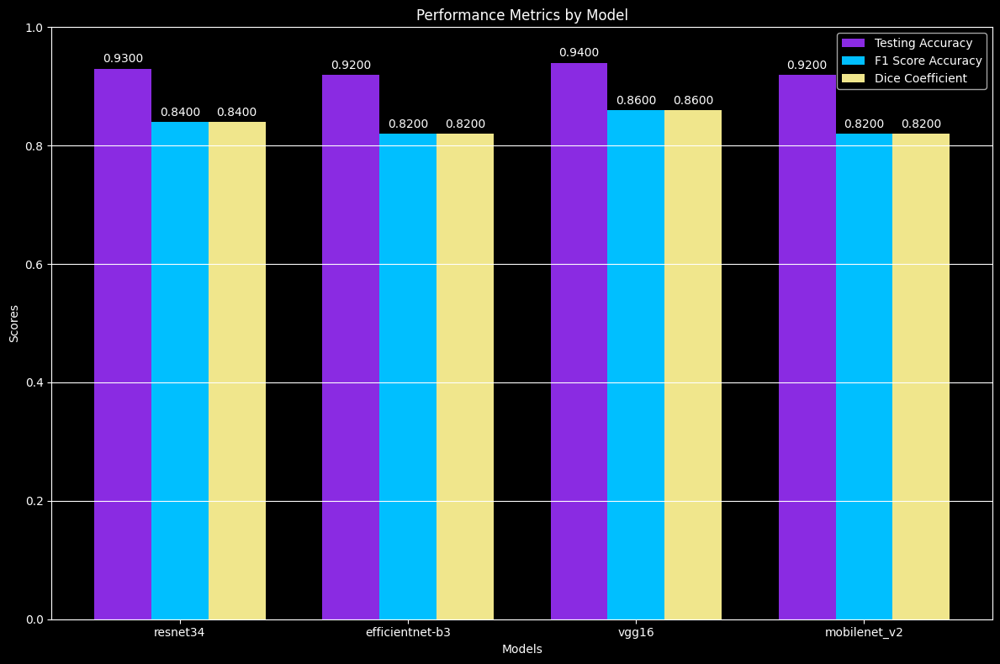

In [104]:
Encoders=['resnet34','efficientnet-b3','vgg16','mobilenet_v2']
Testing_Accuracy=[0.9298548544606855,0.9209949124243951,0.9381014916204637,0.9230907809349799]
F1_Score_Accuracy=[0.8449516929236661,0.8213107234940752,0.861738596958016,0.8164024036303561]
Dice_Coffient=[0.8449516892433167,0.8213106989860535, 0.8617386221885681,0.8164023756980896]


# Round the metrics to 4 decimal places
testing_accuracy = [round(x, 2) for x in Testing_Accuracy]
f1_score_accuracy = [round(x, 2) for x in F1_Score_Accuracy]
dice_coefficient = [round(x, 2) for x in Dice_Coffient]

# Number of models
n_models = len(Encoders)
bar_width = 0.25  # Width of each bar
index = np.arange(n_models)  # The x locations for the groups

# Create figure and axis
fig, ax = plt.subplots(figsize=(12, 8))

# Plot bars
bars1 = ax.bar(index - bar_width, testing_accuracy, bar_width, label='Testing Accuracy',color='#8a2be2')
bars2 = ax.bar(index, f1_score_accuracy, bar_width, label='F1 Score Accuracy',color='#00bfff')
bars3 = ax.bar(index + bar_width, dice_coefficient, bar_width, label='Dice Coefficient',color='#f0e68c')

# Add labels and title
ax.set_xlabel('Models')
ax.set_ylabel('Scores')
ax.set_title('Performance Metrics by Model')
ax.set_xticks(index)
ax.set_xticklabels(Encoders)
ax.legend()

# Show gridlines and set y-axis limit for better visibility
ax.yaxis.grid(True)
ax.set_ylim(0, 1)

# Annotate bars with the exact values
for bars in [bars1, bars2, bars3]:
    for bar in bars:
        height = bar.get_height()
        ax.annotate(f'{height:.4f}',
                    xy=(bar.get_x() + bar.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

# Show plot
plt.tight_layout()
plt.show()

# **_Plotting of mobilenet model_**

In [100]:

def display_predictions(images, ground_truths, predictions, y_pred_binary, num_images=6):
    # Convert tensors to numpy arrays for plotting
    images = images.cpu().numpy()
    ground_truths = ground_truths.cpu().numpy()
    predictions = predictions.cpu().detach().numpy()
    y_pred_binary = y_pred_binary.cpu().detach().numpy()
    
    # Adjust figure size based on the number of images
    plt.figure(figsize=(20, 5 * num_images))
    
    for i in range(num_images):
        # Display original RGB image
        plt.subplot(num_images, 4, 4 * i + 1)
        img = images[i]
        
        # Extract RGB bands
        red_band = img[0, :, :]  # Band 0 - Red
        green_band = img[1, :, :]  # Band 1 - Green
        blue_band = img[2, :, :]  # Band 2 - Blue
        
        # Create RGB composite
        rgb_composite = np.stack([red_band, green_band, blue_band], axis=-1)
        
        plt.imshow(rgb_composite)
        plt.title(f'Image {i + 1}')
        plt.axis('off')
    
        # Display ground truth
        plt.subplot(num_images, 4, 4 * i + 2)
        plt.imshow(ground_truths[i].squeeze(), cmap='gray')
        plt.title('Ground Truth')
        plt.axis('off')

        # Display raw prediction
        plt.subplot(num_images, 4, 4 * i + 3)
        plt.imshow(predictions[i].squeeze(), cmap='gray')
        plt.title('Raw Prediction')
        plt.axis('off')

        # Display binary prediction
        plt.subplot(num_images, 4, 4 * i + 4)
        plt.imshow(y_pred_binary[i].squeeze(), cmap='gray')
        plt.title('Binary Prediction')
        plt.axis('off')

    plt.tight_layout()
    plt.show()


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056836903..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06973528..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011155946..1.0].


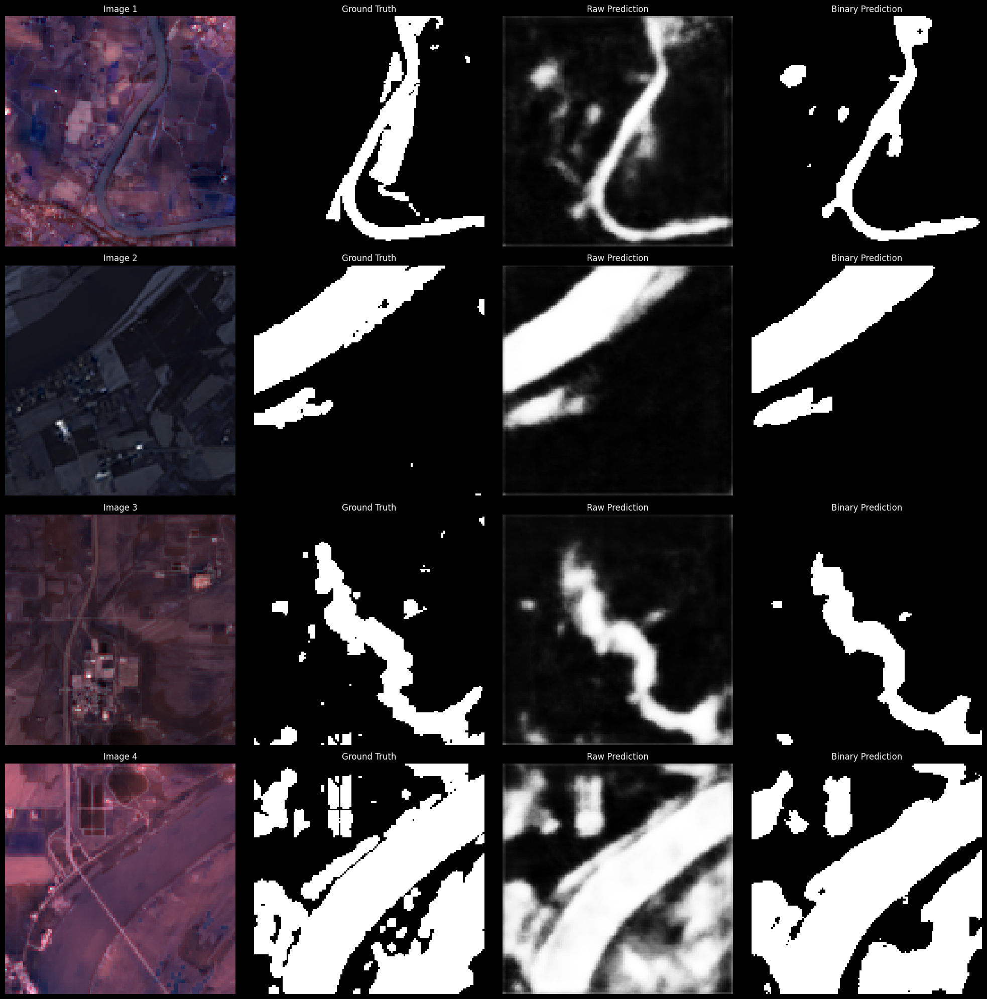

Test F1 Score: 0.8164
Test Dice Coefficient: 0.8164
Test Accuracy: 0.9231
Test IoU Score: 0.6898
Test Confusion Matrix:


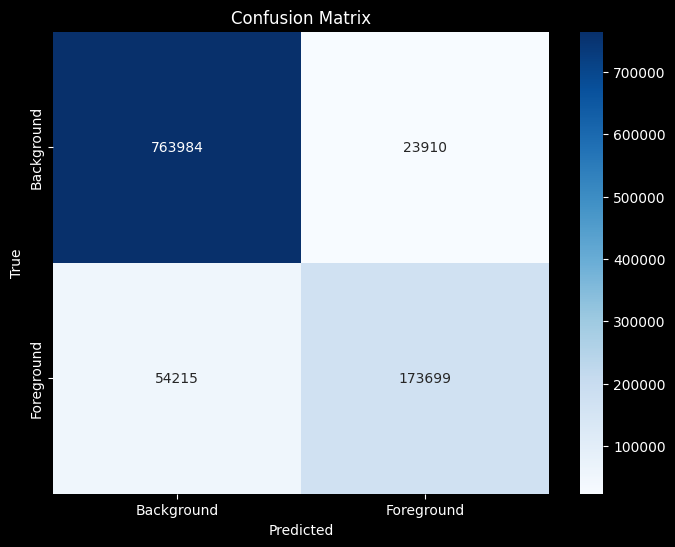

Test Classification Report:
              precision    recall  f1-score   support

         0.0       0.93      0.97      0.95    787894
         1.0       0.88      0.76      0.82    227914

    accuracy                           0.92   1015808
   macro avg       0.91      0.87      0.88   1015808
weighted avg       0.92      0.92      0.92   1015808



In [102]:
model.eval()

# Prepare data loader for the test set
test_loader = prepare_test_data(X_test, y_test)  # You might need to adjust this function to get batches

# Collect predictions and ground truths
all_images = []
all_ground_truths = []
all_predictions = []
all_y_pred_binary = []

with torch.no_grad():
    for inputs, labels in test_loader:
        outputs = model(inputs)
        preds = torch.sigmoid(outputs)
        y_pred_binary = (preds > 0.5).float()

        # Collect results
        all_images.append(inputs)
        all_ground_truths.append(labels)
        all_predictions.append(preds)
        all_y_pred_binary.append(y_pred_binary)

# Concatenate results
all_images = torch.cat(all_images)
all_ground_truths = torch.cat(all_ground_truths)
all_predictions = torch.cat(all_predictions)
all_y_pred_binary = torch.cat(all_y_pred_binary)
def calculate_iou_score(y_true, y_pred):
    y_true = y_true.flatten()
    y_pred = y_pred.flatten()
    intersection = np.sum((y_true == 1) & (y_pred == 1))
    union = np.sum((y_true == 1) | (y_pred == 1))
    iou = intersection / (union + 1e-8)  # Adding epsilon to avoid division by zero
    return iou
# Call the function with a sample of images
display_predictions(all_images, all_ground_truths, all_predictions, all_y_pred_binary, num_images=4)
def evaluate_on_test(model, test_loader):
    model.eval()
    with torch.no_grad():
        all_preds = []
        all_labels = []
        for inputs, labels in test_loader:
            outputs = model(inputs)
            preds = torch.sigmoid(outputs)  

            if labels.shape != preds.shape:
                labels = labels.view_as(preds)

            all_preds.append(preds.cpu().numpy())
            all_labels.append(labels.cpu().numpy())

        all_preds = np.concatenate(all_preds)
        all_labels = np.concatenate(all_labels)

        # Convert predictions to binary
        all_preds_binary = (all_preds > 0.5).astype(int)

        # Calculate metrics
        test_f1_score = f1_score_sklearn(all_labels.flatten(), all_preds_binary.flatten())
        test_dice = DiceCoefficient()(torch.tensor(all_preds), torch.tensor(all_labels)).item()
        test_accuracy = accuracy_score(all_labels.flatten(), all_preds_binary.flatten())
        test_iou = calculate_iou_score(all_labels, all_preds_binary)

        # Print metrics
        print(f'Test F1 Score: {test_f1_score:.4f}')
        print(f'Test Dice Coefficient: {test_dice:.4f}')
        print(f'Test Accuracy: {test_accuracy:.4f}')
        print(f'Test IoU Score: {test_iou:.4f}')

        # Confusion Matrix and Classification Report
        test_conf_matrix = confusion_matrix(all_labels.flatten(), all_preds_binary.flatten())
        test_class_report = classification_report(all_labels.flatten(), all_preds_binary.flatten())

        print("Test Confusion Matrix:")
        plot_confusion_matrix(test_conf_matrix, class_names=['Background', 'Foreground'])
        print("Test Classification Report:")
        print(test_class_report)
evaluate_on_test(model, test_loader)

* All models seems good 